https://colab.research.google.com/github/Lucien-Piat/DEL_Single_Tree_Detection/blob/main/notebook.ipynb

In [1]:
import sys
sys.path.append("../")

import matplotlib.pyplot as plt
from IPython.display import clear_output
from src.data_pipeline import make_dataset

EPOCHS = 40
BATCH_SIZE = 32

In [2]:
train_dataset = make_dataset('../data/gold/train', batch_size=BATCH_SIZE)
valid_dataset = make_dataset('../data/gold/valid', batch_size=BATCH_SIZE)
test_dataset = make_dataset('../data/gold/test', batch_size=BATCH_SIZE)

---

In [3]:
import tensorflow as tf
from src.pix2pix import pix2pix

In [4]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

In [5]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [6]:
def unet_model(output_channels:int = 1):
    inputs = tf.keras.layers.Input(shape=[128, 128, 3])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    # This is the last layer of the model
    last = tf.keras.layers.Conv2DTranspose(
        filters=output_channels, kernel_size=3, strides=2,
        padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [7]:
def mean_iou(y_true, y_pred):
    batch_size = tf.shape(y_true)[0]

    # Flatten
    y_true = tf.reshape(y_true, [batch_size, -1])
    y_pred = tf.reshape(y_pred, [batch_size, -1]) # logits
    y_pred = tf.cast(y_pred >= 0, tf.float32)     # classes (0 or 1)

    # Intersection
    intersection = tf.reduce_sum(y_true * y_pred, axis=1)

    # Union
    union = tf.reduce_sum(y_true, axis=1) + tf.reduce_sum(y_pred, axis=1) - intersection

    # handle the case where the denominator is 0
    intersection = tf.where(union > 0, intersection, 0)
    union = tf.where(union > 0, union, 1)

    return tf.reduce_mean(intersection / union)

In [8]:
model = unet_model()
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[
        'accuracy',
        mean_iou
    ]
)

2024-04-30 14:33:55.546051: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


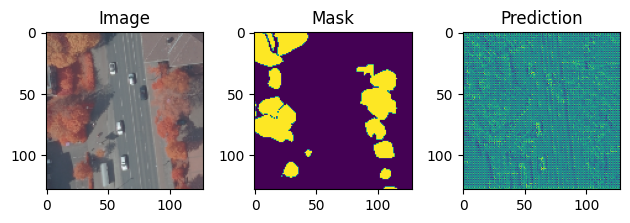

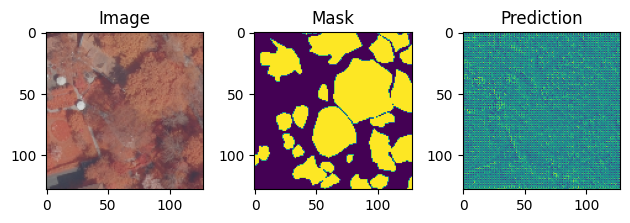

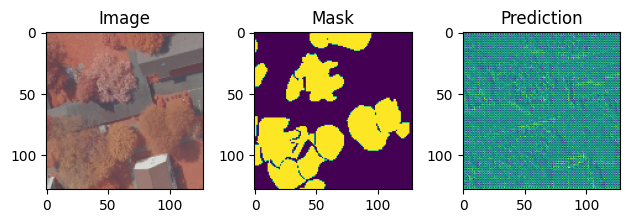

In [9]:
import matplotlib.pyplot as plt 

def show_predictions(n = 3, dataset=valid_dataset):
    for image, mask in list(dataset.take(n)):
        pred_mask_logits = model.predict(image, verbose=0)
        pred_mask = tf.sigmoid(pred_mask_logits)
        plt.subplot(1, 3, 1)
        plt.imshow(image[0])
        plt.title('Image')
        plt.subplot(1, 3, 2)
        plt.imshow(mask[0])
        plt.title('Mask')
        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask[0, :, :, 0])
        plt.title('Prediction')
        plt.tight_layout()
        plt.show()  

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print('\nSample Prediction after epoch {}\n'.format(epoch+1))
        show_predictions()

show_predictions(n=3)

Epoch 1/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 881ms/step - accuracy: 0.7955 - loss: 0.4043 - mean_iou: 0.3722
Sample Prediction after epoch 1



2024-04-30 14:36:40.686071: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


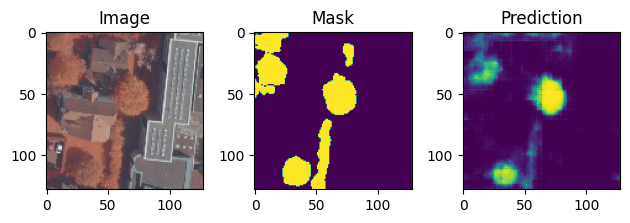

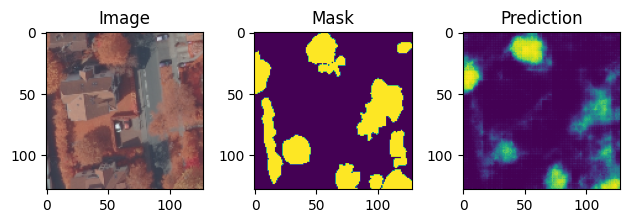

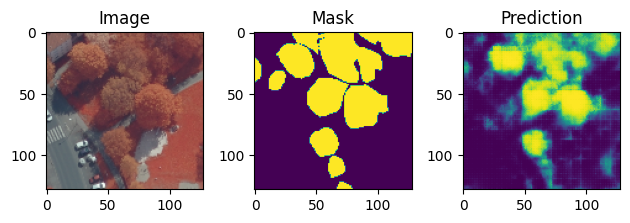

100/100 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.7960 - loss: 0.4034 - mean_iou: 0.3736 - val_accuracy: 0.8495 - val_loss: 0.2798 - val_mean_iou: 0.5425
Epoch 2/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8897 - loss: 0.2358 - mean_iou: 0.6488
Sample Prediction after epoch 2



2024-04-30 14:39:53.966618: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


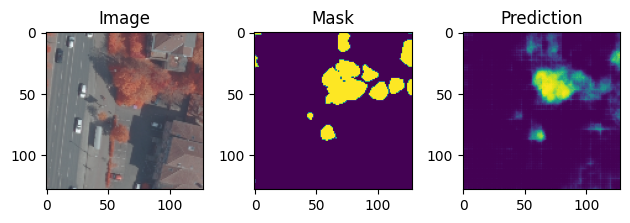

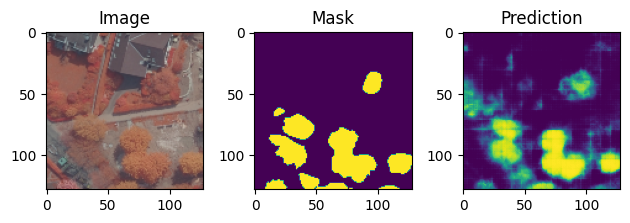

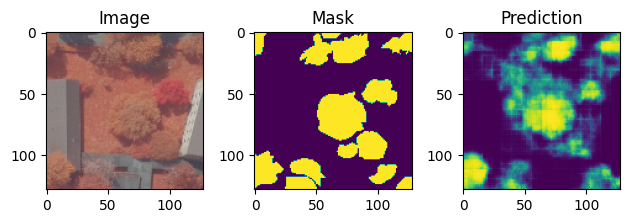

100/100 ━━━━━━━━━━━━━━━━━━━━ 193s 2s/step - accuracy: 0.8897 - loss: 0.2357 - mean_iou: 0.6489 - val_accuracy: 0.8709 - val_loss: 0.2523 - val_mean_iou: 0.5985
Epoch 3/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9009 - loss: 0.2138 - mean_iou: 0.6778
Sample Prediction after epoch 3



2024-04-30 14:43:07.715461: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


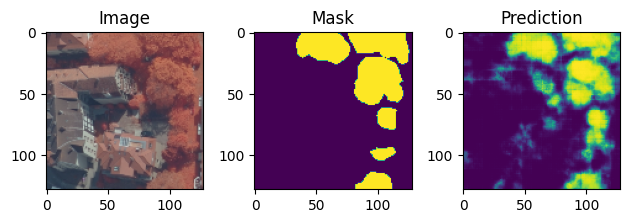

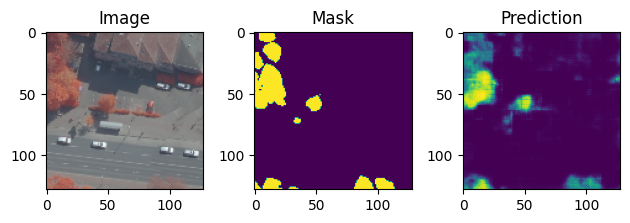

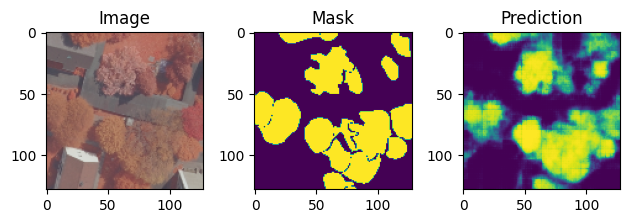

100/100 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.9010 - loss: 0.2138 - mean_iou: 0.6779 - val_accuracy: 0.8909 - val_loss: 0.2365 - val_mean_iou: 0.6613
Epoch 4/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9087 - loss: 0.1994 - mean_iou: 0.7047
Sample Prediction after epoch 4



2024-04-30 14:45:54.603285: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


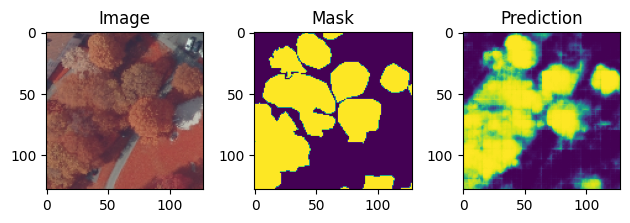

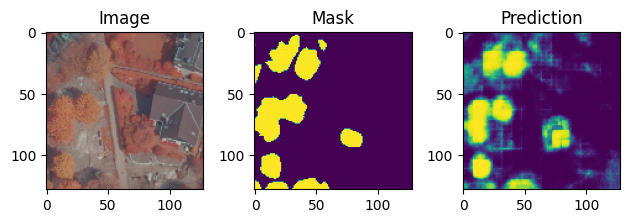

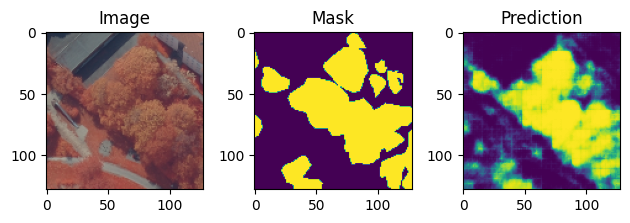

100/100 ━━━━━━━━━━━━━━━━━━━━ 167s 2s/step - accuracy: 0.9088 - loss: 0.1994 - mean_iou: 0.7047 - val_accuracy: 0.8879 - val_loss: 0.2383 - val_mean_iou: 0.6503
Epoch 5/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 923ms/step - accuracy: 0.9122 - loss: 0.1919 - mean_iou: 0.7137
Sample Prediction after epoch 5



2024-04-30 14:48:26.804283: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


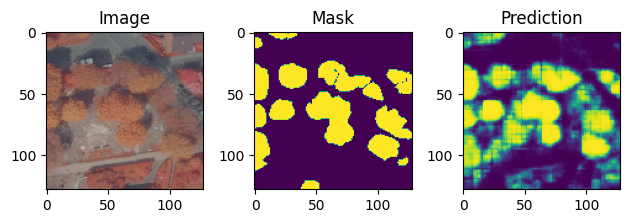

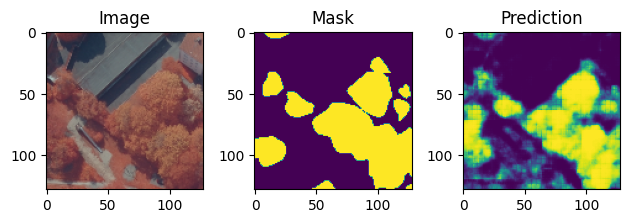

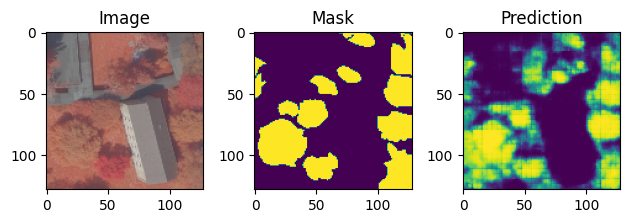

100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.9122 - loss: 0.1918 - mean_iou: 0.7138 - val_accuracy: 0.8941 - val_loss: 0.2365 - val_mean_iou: 0.6700
Epoch 6/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 911ms/step - accuracy: 0.9193 - loss: 0.1789 - mean_iou: 0.7251
Sample Prediction after epoch 6



2024-04-30 14:50:56.936218: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


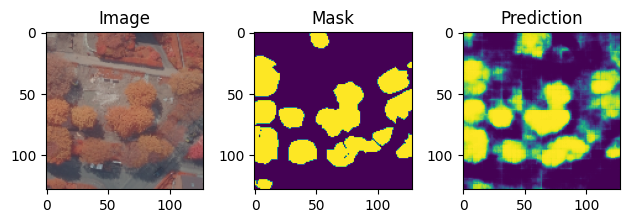

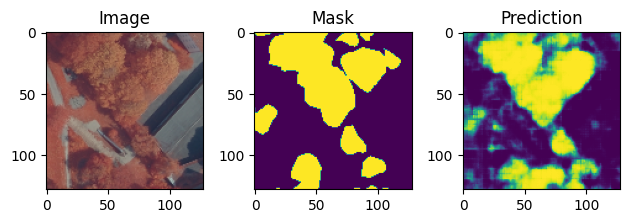

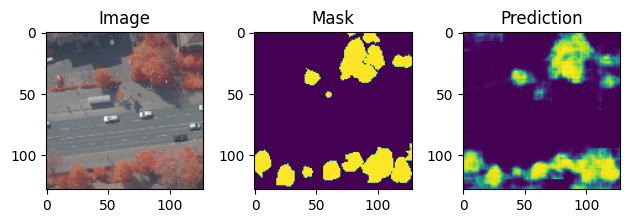

100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 2s/step - accuracy: 0.9193 - loss: 0.1789 - mean_iou: 0.7252 - val_accuracy: 0.8957 - val_loss: 0.2464 - val_mean_iou: 0.6713
Epoch 7/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 909ms/step - accuracy: 0.9205 - loss: 0.1753 - mean_iou: 0.7397
Sample Prediction after epoch 7



2024-04-30 14:53:31.957775: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


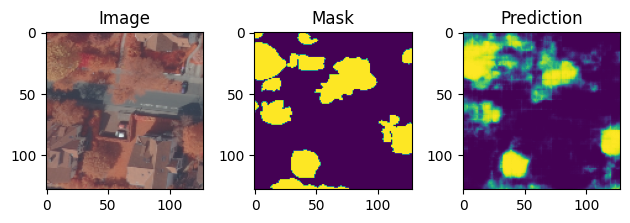

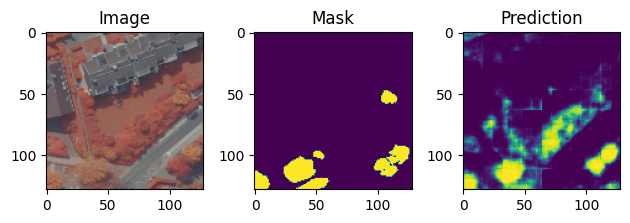

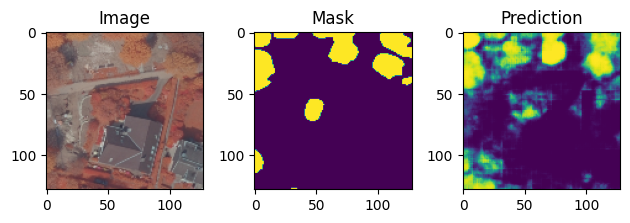

100/100 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.9205 - loss: 0.1753 - mean_iou: 0.7397 - val_accuracy: 0.8959 - val_loss: 0.2379 - val_mean_iou: 0.6697
Epoch 8/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 933ms/step - accuracy: 0.9249 - loss: 0.1663 - mean_iou: 0.7479
Sample Prediction after epoch 8



2024-04-30 14:56:04.845285: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


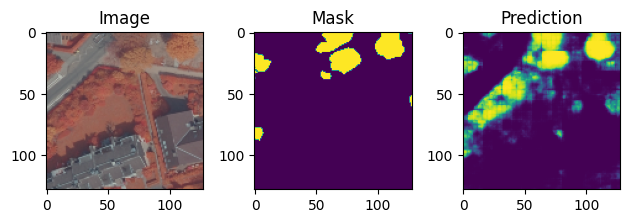

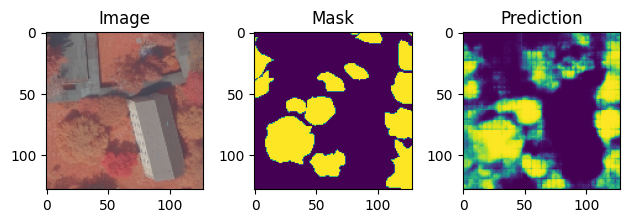

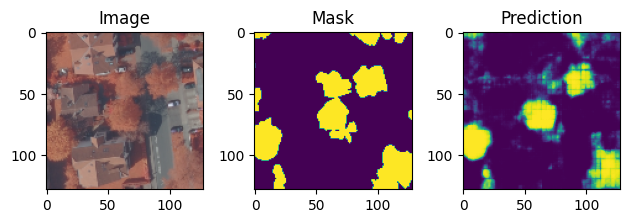

100/100 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.9250 - loss: 0.1663 - mean_iou: 0.7479 - val_accuracy: 0.8952 - val_loss: 0.2423 - val_mean_iou: 0.6689
Epoch 9/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 903ms/step - accuracy: 0.9276 - loss: 0.1613 - mean_iou: 0.7567
Sample Prediction after epoch 9



2024-04-30 14:58:34.739697: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


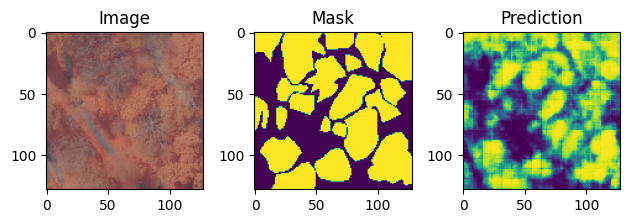

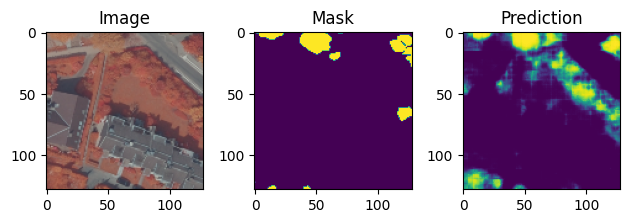

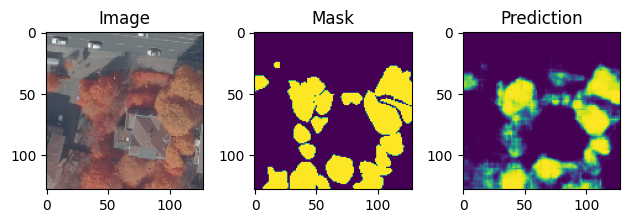

100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 2s/step - accuracy: 0.9276 - loss: 0.1613 - mean_iou: 0.7567 - val_accuracy: 0.8911 - val_loss: 0.2339 - val_mean_iou: 0.6629
Epoch 10/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 929ms/step - accuracy: 0.9287 - loss: 0.1587 - mean_iou: 0.7580
Sample Prediction after epoch 10



2024-04-30 15:01:07.156131: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


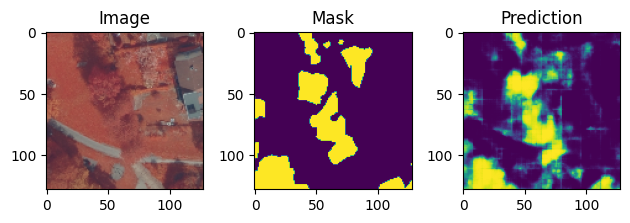

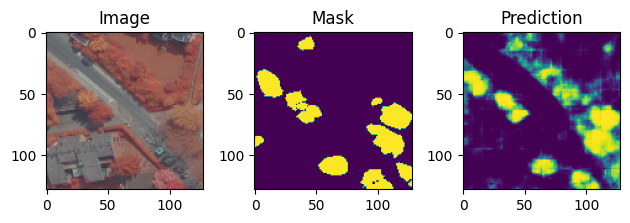

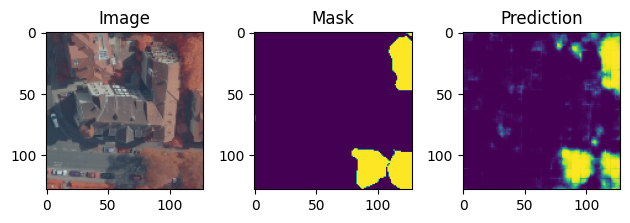

100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.9287 - loss: 0.1586 - mean_iou: 0.7581 - val_accuracy: 0.8979 - val_loss: 0.2451 - val_mean_iou: 0.6741
Epoch 11/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 912ms/step - accuracy: 0.9309 - loss: 0.1542 - mean_iou: 0.7648
Sample Prediction after epoch 11



2024-04-30 15:03:37.697911: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


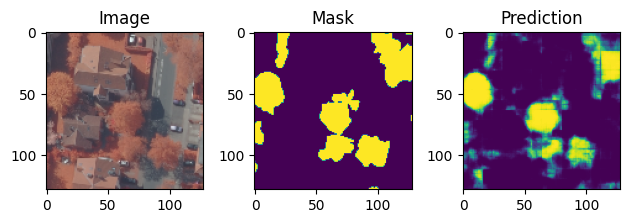

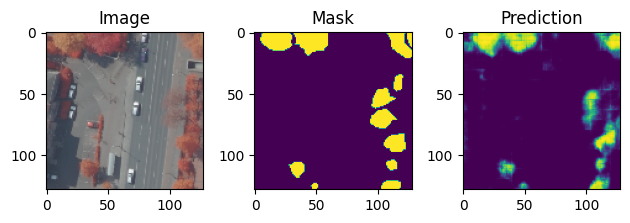

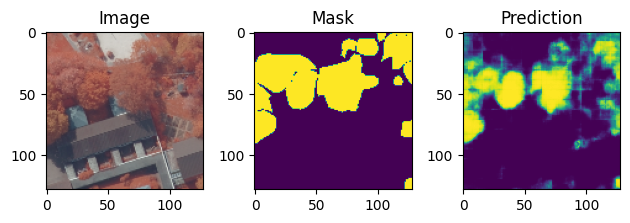

100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.9309 - loss: 0.1542 - mean_iou: 0.7648 - val_accuracy: 0.8961 - val_loss: 0.2345 - val_mean_iou: 0.6674
Epoch 12/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 906ms/step - accuracy: 0.9331 - loss: 0.1494 - mean_iou: 0.7699
Sample Prediction after epoch 12



2024-04-30 15:06:07.711087: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


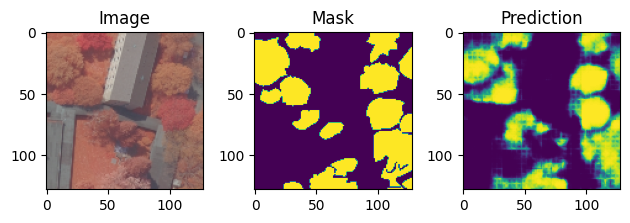

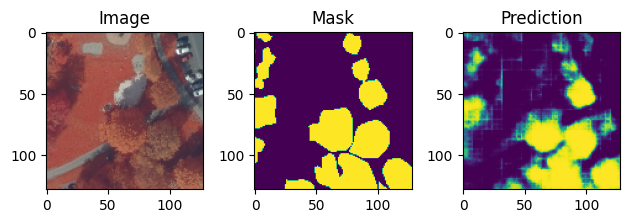

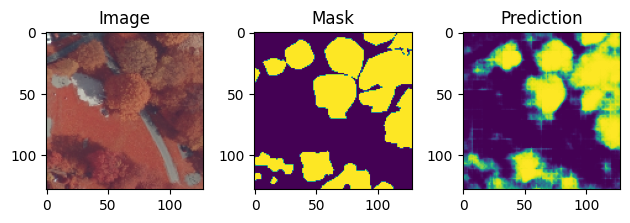

100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 2s/step - accuracy: 0.9331 - loss: 0.1494 - mean_iou: 0.7700 - val_accuracy: 0.8941 - val_loss: 0.2359 - val_mean_iou: 0.6639
Epoch 13/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 912ms/step - accuracy: 0.9350 - loss: 0.1458 - mean_iou: 0.7754
Sample Prediction after epoch 13



2024-04-30 15:08:39.297347: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


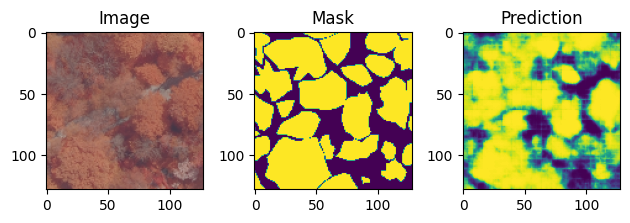

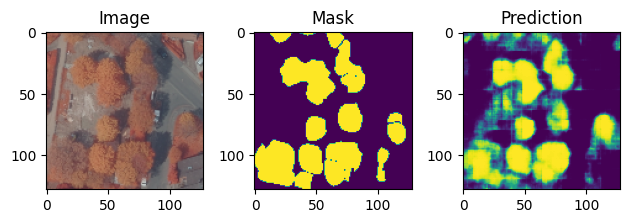

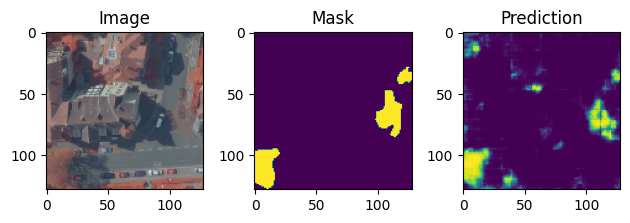

100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.9350 - loss: 0.1457 - mean_iou: 0.7754 - val_accuracy: 0.8958 - val_loss: 0.2410 - val_mean_iou: 0.6696
Epoch 14/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 916ms/step - accuracy: 0.9356 - loss: 0.1437 - mean_iou: 0.7815
Sample Prediction after epoch 14



2024-04-30 15:11:10.130142: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


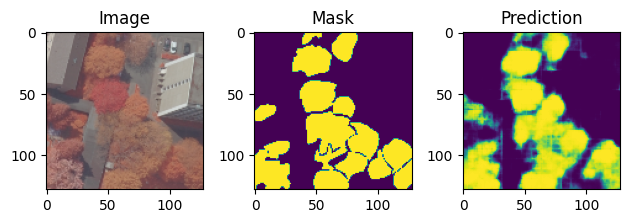

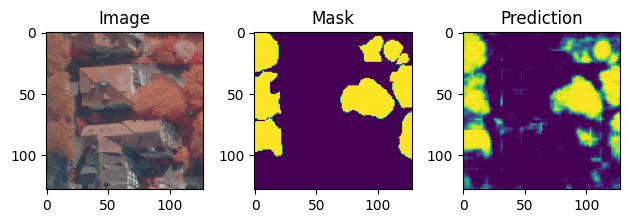

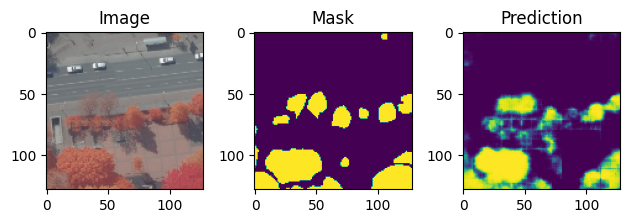

100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.9356 - loss: 0.1437 - mean_iou: 0.7815 - val_accuracy: 0.8961 - val_loss: 0.2524 - val_mean_iou: 0.6720
Epoch 15/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 913ms/step - accuracy: 0.9382 - loss: 0.1383 - mean_iou: 0.7852
Sample Prediction after epoch 15



2024-04-30 15:13:41.975151: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


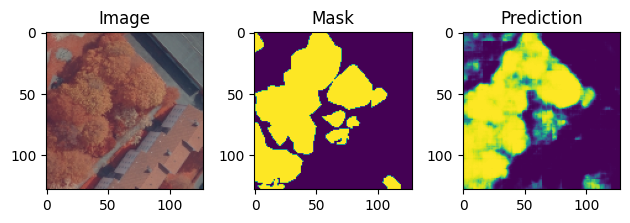

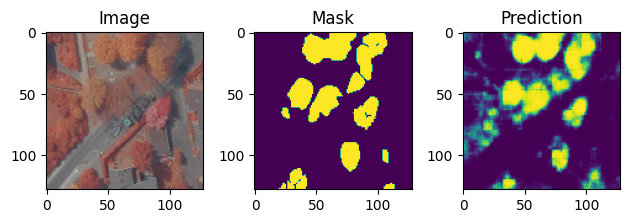

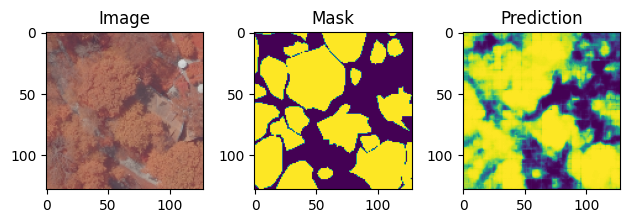

100/100 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.9382 - loss: 0.1383 - mean_iou: 0.7852 - val_accuracy: 0.8974 - val_loss: 0.2463 - val_mean_iou: 0.6752
Epoch 16/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - accuracy: 0.9383 - loss: 0.1382 - mean_iou: 0.7876
Sample Prediction after epoch 16



2024-04-30 15:16:12.651750: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


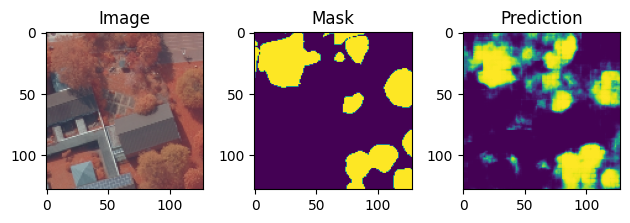

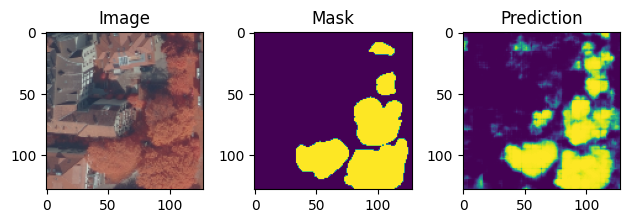

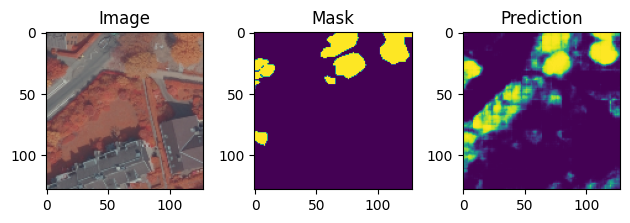

100/100 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.9383 - loss: 0.1382 - mean_iou: 0.7877 - val_accuracy: 0.8935 - val_loss: 0.2517 - val_mean_iou: 0.6638
Epoch 17/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 929ms/step - accuracy: 0.9396 - loss: 0.1351 - mean_iou: 0.7886
Sample Prediction after epoch 17



2024-04-30 15:18:45.240015: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


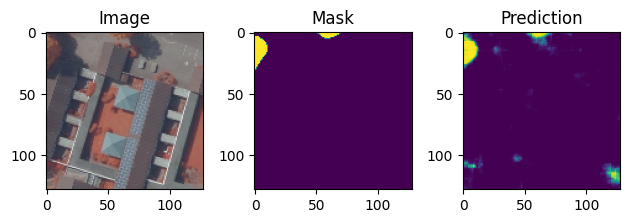

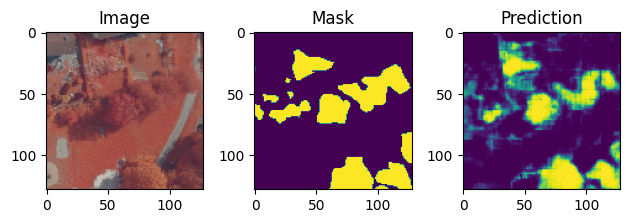

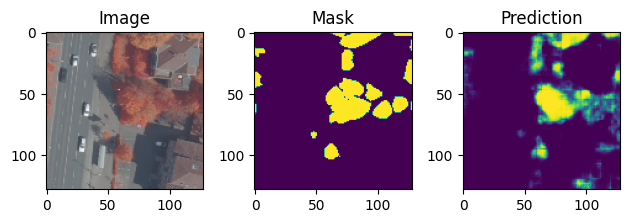

100/100 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.9396 - loss: 0.1350 - mean_iou: 0.7886 - val_accuracy: 0.8976 - val_loss: 0.2439 - val_mean_iou: 0.6753
Epoch 18/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 995ms/step - accuracy: 0.9403 - loss: 0.1342 - mean_iou: 0.7969
Sample Prediction after epoch 18



2024-04-30 15:21:35.713782: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


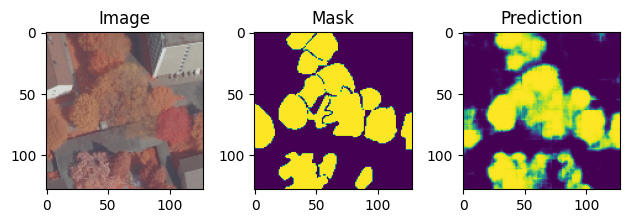

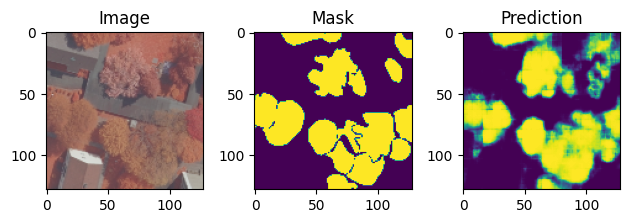

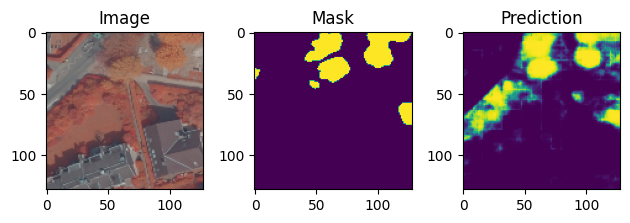

100/100 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.9403 - loss: 0.1342 - mean_iou: 0.7969 - val_accuracy: 0.8953 - val_loss: 0.2526 - val_mean_iou: 0.6700
Epoch 19/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 962ms/step - accuracy: 0.9420 - loss: 0.1303 - mean_iou: 0.7962
Sample Prediction after epoch 19



2024-04-30 15:24:13.531591: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


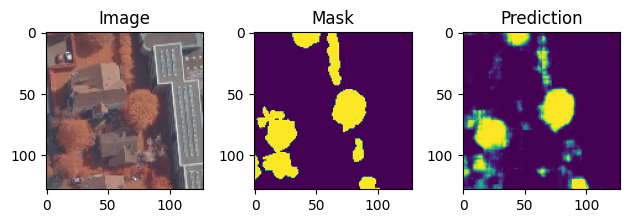

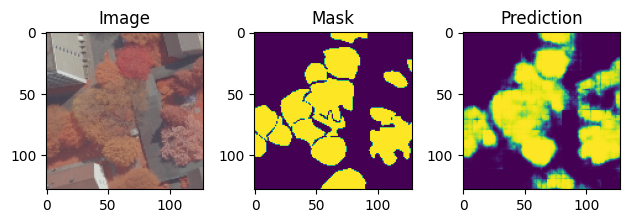

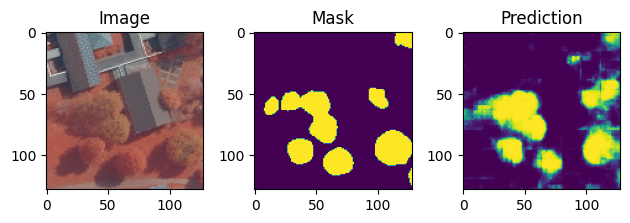

100/100 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.9420 - loss: 0.1303 - mean_iou: 0.7962 - val_accuracy: 0.8957 - val_loss: 0.2622 - val_mean_iou: 0.6694
Epoch 20/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 932ms/step - accuracy: 0.9418 - loss: 0.1308 - mean_iou: 0.8039
Sample Prediction after epoch 20



2024-04-30 15:26:51.473195: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


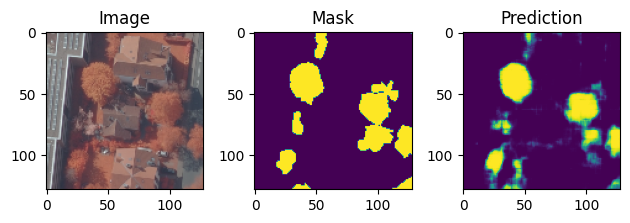

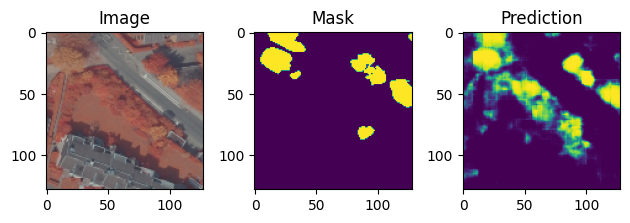

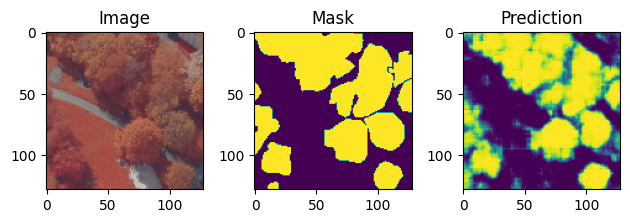

100/100 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.9418 - loss: 0.1308 - mean_iou: 0.8039 - val_accuracy: 0.8958 - val_loss: 0.2498 - val_mean_iou: 0.6700
Epoch 21/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9417 - loss: 0.1312 - mean_iou: 0.8043
Sample Prediction after epoch 21



2024-04-30 15:29:52.813079: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


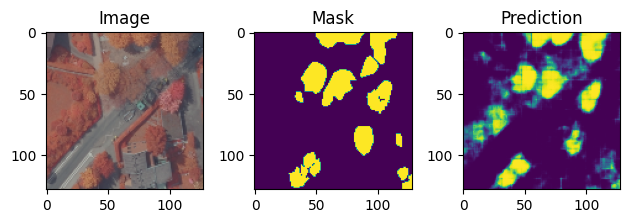

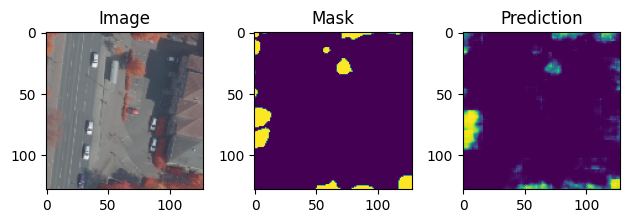

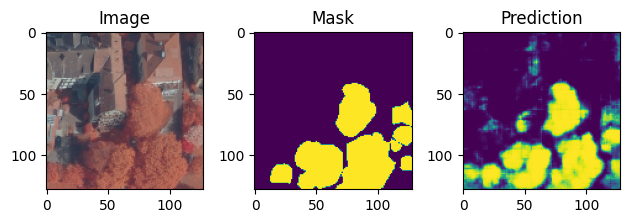

100/100 ━━━━━━━━━━━━━━━━━━━━ 181s 2s/step - accuracy: 0.9417 - loss: 0.1311 - mean_iou: 0.8043 - val_accuracy: 0.8957 - val_loss: 0.2514 - val_mean_iou: 0.6672
Epoch 22/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9447 - loss: 0.1243 - mean_iou: 0.8079
Sample Prediction after epoch 22



2024-04-30 15:32:56.919898: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


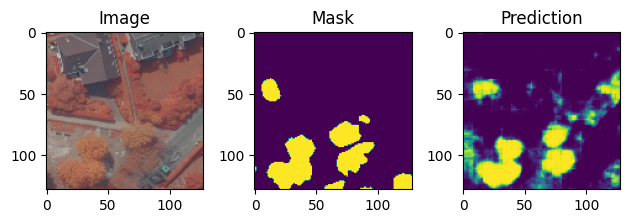

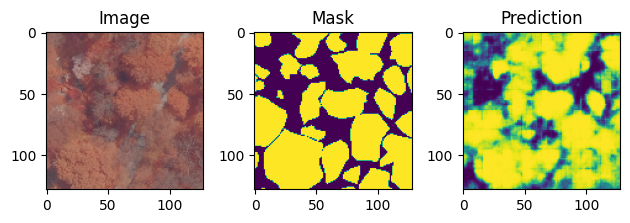

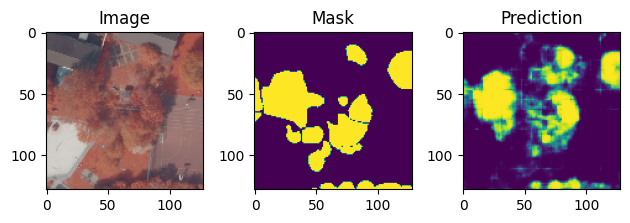

100/100 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accuracy: 0.9447 - loss: 0.1243 - mean_iou: 0.8080 - val_accuracy: 0.8949 - val_loss: 0.2539 - val_mean_iou: 0.6615
Epoch 23/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9441 - loss: 0.1257 - mean_iou: 0.8069
Sample Prediction after epoch 23



2024-04-30 15:35:52.566653: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


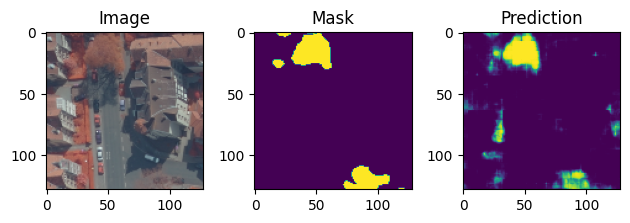

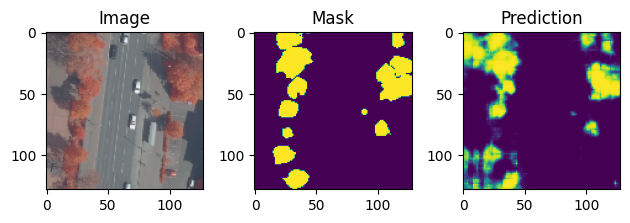

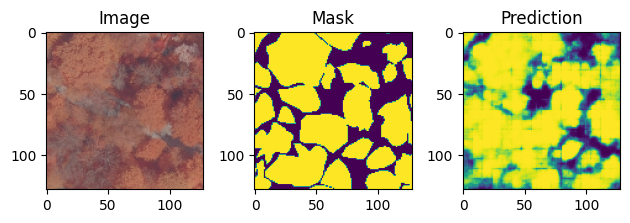

100/100 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.9441 - loss: 0.1257 - mean_iou: 0.8069 - val_accuracy: 0.8970 - val_loss: 0.2611 - val_mean_iou: 0.6735
Epoch 24/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9444 - loss: 0.1250 - mean_iou: 0.8050
Sample Prediction after epoch 24



2024-04-30 15:39:05.900506: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


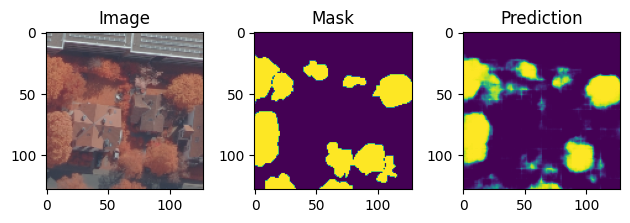

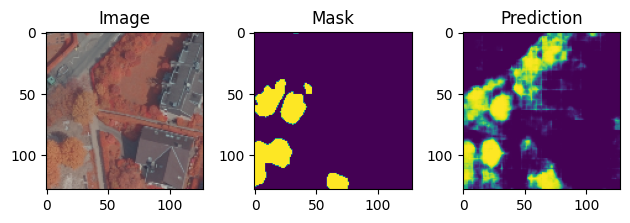

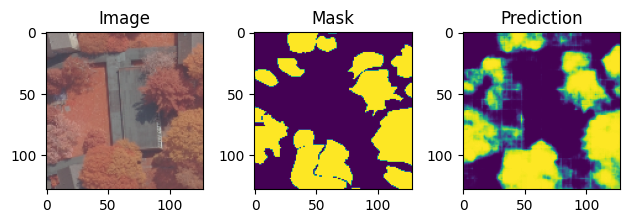

100/100 ━━━━━━━━━━━━━━━━━━━━ 193s 2s/step - accuracy: 0.9444 - loss: 0.1250 - mean_iou: 0.8051 - val_accuracy: 0.8932 - val_loss: 0.2484 - val_mean_iou: 0.6600
Epoch 25/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9466 - loss: 0.1205 - mean_iou: 0.8096
Sample Prediction after epoch 25



2024-04-30 15:42:00.151111: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


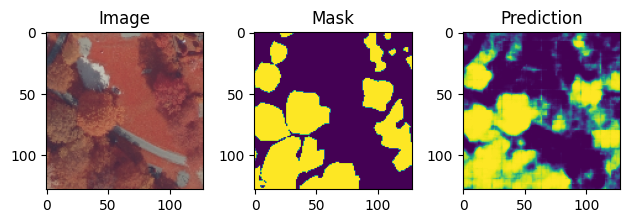

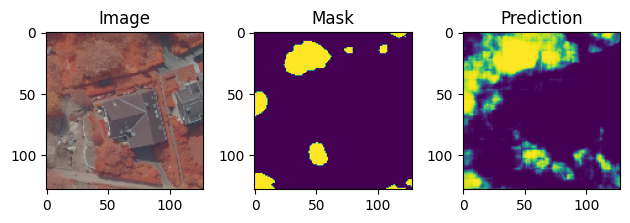

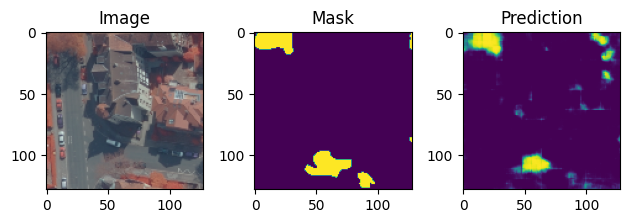

100/100 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.9466 - loss: 0.1205 - mean_iou: 0.8096 - val_accuracy: 0.8963 - val_loss: 0.2530 - val_mean_iou: 0.6718
Epoch 26/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9458 - loss: 0.1223 - mean_iou: 0.8120
Sample Prediction after epoch 26



2024-04-30 15:44:56.848836: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


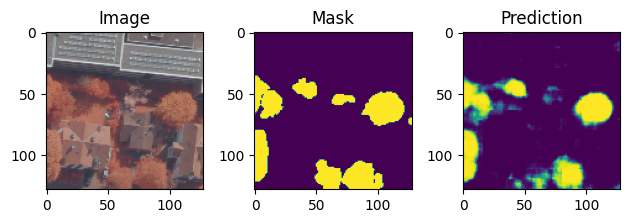

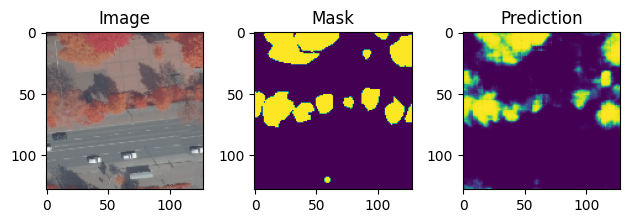

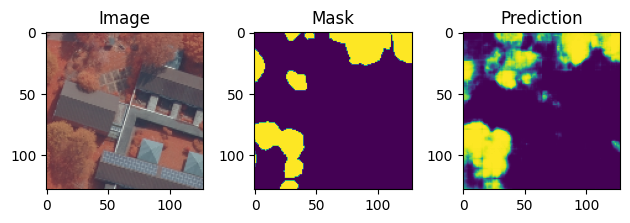

100/100 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - accuracy: 0.9458 - loss: 0.1223 - mean_iou: 0.8120 - val_accuracy: 0.8937 - val_loss: 0.2544 - val_mean_iou: 0.6619
Epoch 27/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9472 - loss: 0.1192 - mean_iou: 0.8128
Sample Prediction after epoch 27



2024-04-30 15:48:12.923696: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


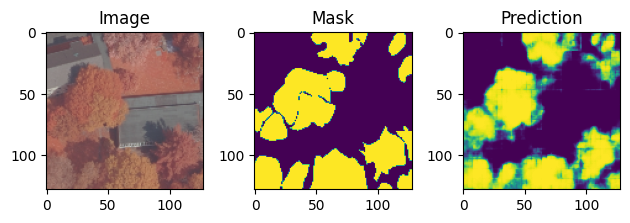

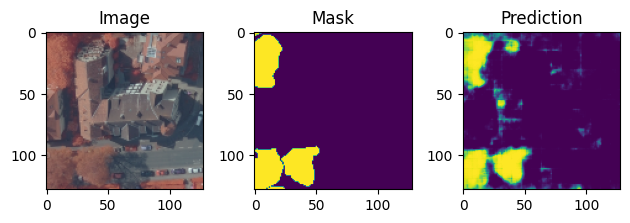

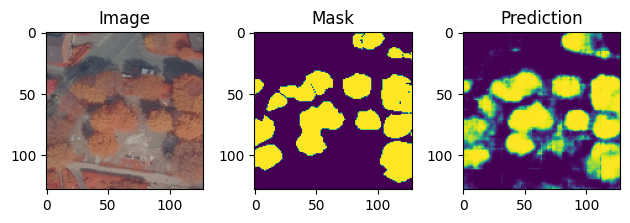

100/100 ━━━━━━━━━━━━━━━━━━━━ 196s 2s/step - accuracy: 0.9472 - loss: 0.1192 - mean_iou: 0.8128 - val_accuracy: 0.8973 - val_loss: 0.2515 - val_mean_iou: 0.6742
Epoch 28/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9474 - loss: 0.1189 - mean_iou: 0.8206
Sample Prediction after epoch 28



2024-04-30 15:51:43.590211: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


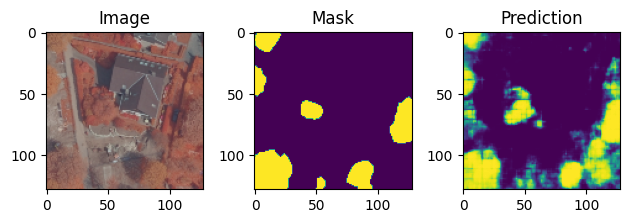

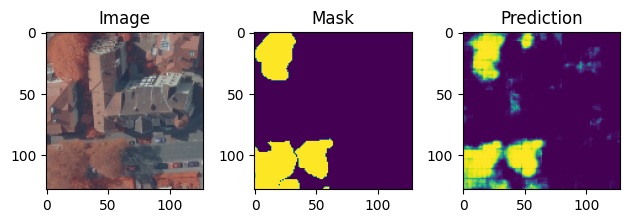

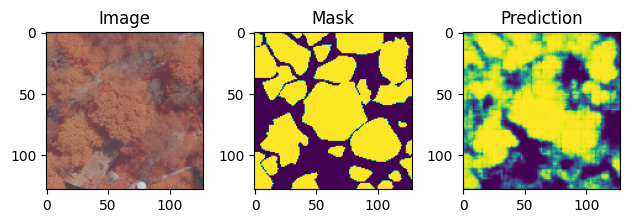

100/100 ━━━━━━━━━━━━━━━━━━━━ 211s 2s/step - accuracy: 0.9474 - loss: 0.1189 - mean_iou: 0.8205 - val_accuracy: 0.8965 - val_loss: 0.2569 - val_mean_iou: 0.6719
Epoch 29/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9481 - loss: 0.1172 - mean_iou: 0.8197
Sample Prediction after epoch 29



2024-04-30 15:55:01.210751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


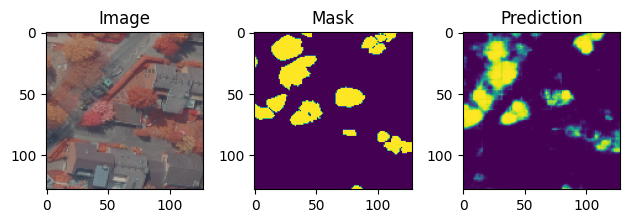

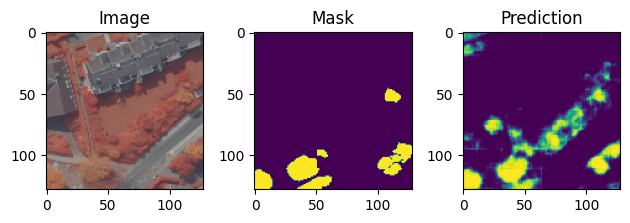

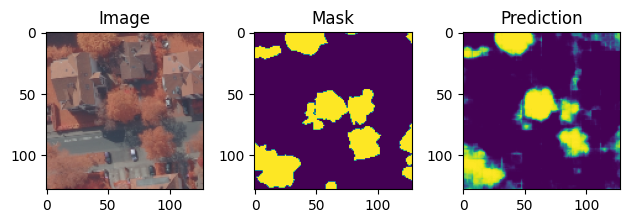

100/100 ━━━━━━━━━━━━━━━━━━━━ 198s 2s/step - accuracy: 0.9481 - loss: 0.1172 - mean_iou: 0.8197 - val_accuracy: 0.8969 - val_loss: 0.2557 - val_mean_iou: 0.6728
Epoch 30/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9480 - loss: 0.1173 - mean_iou: 0.8199
Sample Prediction after epoch 30



2024-04-30 15:58:36.691690: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


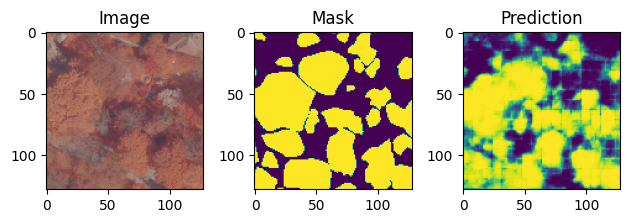

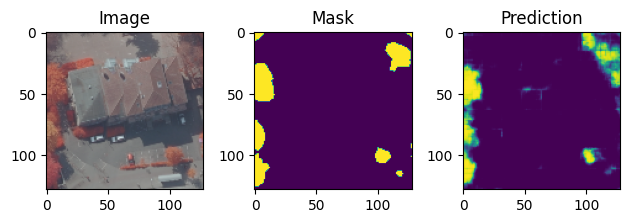

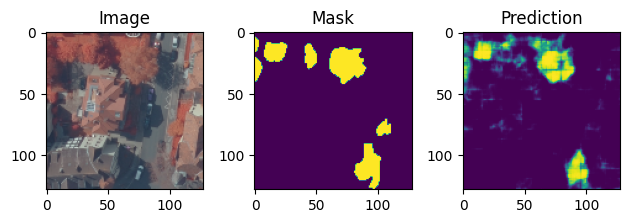

100/100 ━━━━━━━━━━━━━━━━━━━━ 215s 2s/step - accuracy: 0.9480 - loss: 0.1173 - mean_iou: 0.8199 - val_accuracy: 0.8972 - val_loss: 0.2506 - val_mean_iou: 0.6763
Epoch 31/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9480 - loss: 0.1175 - mean_iou: 0.8194
Sample Prediction after epoch 31



2024-04-30 16:02:18.010431: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


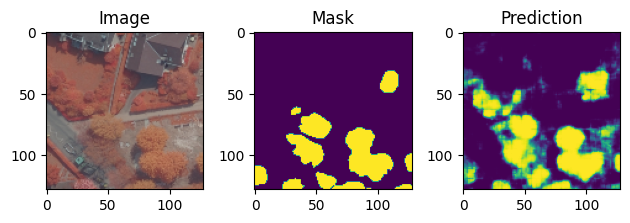

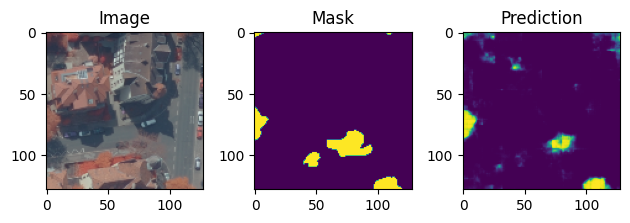

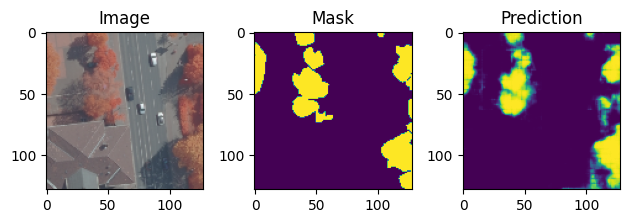

100/100 ━━━━━━━━━━━━━━━━━━━━ 221s 2s/step - accuracy: 0.9480 - loss: 0.1175 - mean_iou: 0.8194 - val_accuracy: 0.8971 - val_loss: 0.2606 - val_mean_iou: 0.6715
Epoch 32/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9497 - loss: 0.1137 - mean_iou: 0.8226
Sample Prediction after epoch 32



2024-04-30 16:06:26.398746: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


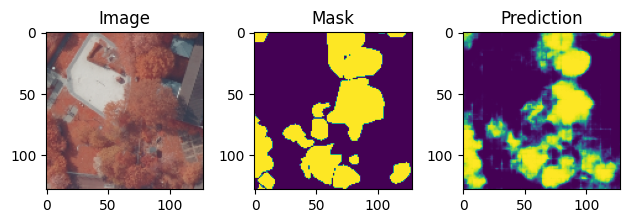

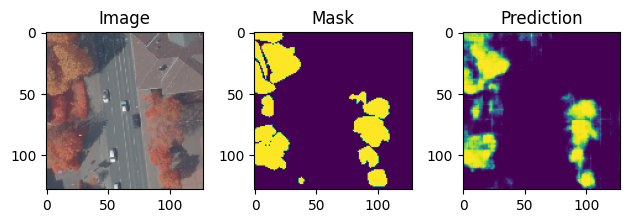

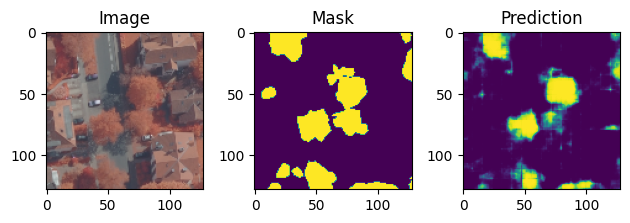

100/100 ━━━━━━━━━━━━━━━━━━━━ 250s 3s/step - accuracy: 0.9497 - loss: 0.1137 - mean_iou: 0.8226 - val_accuracy: 0.8945 - val_loss: 0.2598 - val_mean_iou: 0.6657
Epoch 33/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9496 - loss: 0.1136 - mean_iou: 0.8285
Sample Prediction after epoch 33



2024-04-30 16:10:06.708451: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


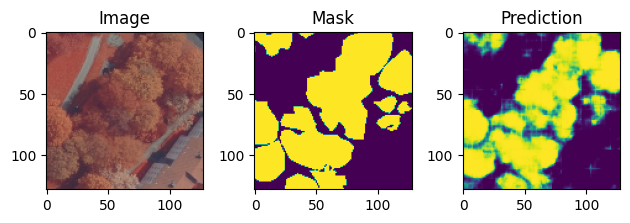

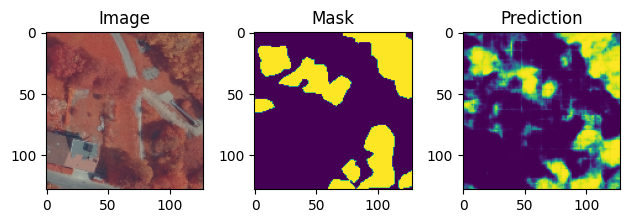

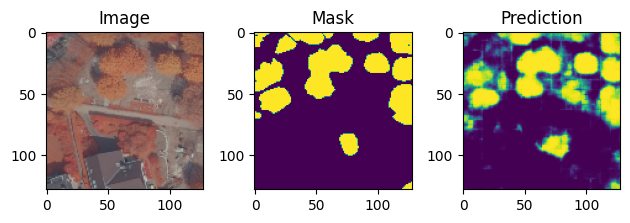

100/100 ━━━━━━━━━━━━━━━━━━━━ 218s 2s/step - accuracy: 0.9496 - loss: 0.1136 - mean_iou: 0.8285 - val_accuracy: 0.8972 - val_loss: 0.2556 - val_mean_iou: 0.6777
Epoch 34/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 949ms/step - accuracy: 0.9502 - loss: 0.1127 - mean_iou: 0.8263
Sample Prediction after epoch 34



2024-04-30 16:12:41.702233: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


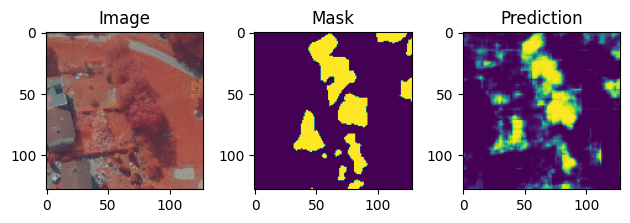

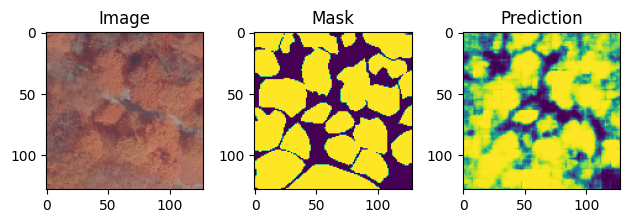

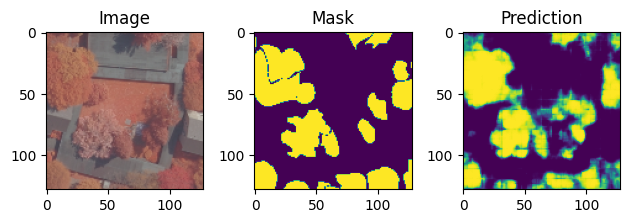

100/100 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.9502 - loss: 0.1127 - mean_iou: 0.8263 - val_accuracy: 0.8959 - val_loss: 0.2617 - val_mean_iou: 0.6705
Epoch 35/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 928ms/step - accuracy: 0.9508 - loss: 0.1115 - mean_iou: 0.8252
Sample Prediction after epoch 35



2024-04-30 16:15:15.191436: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


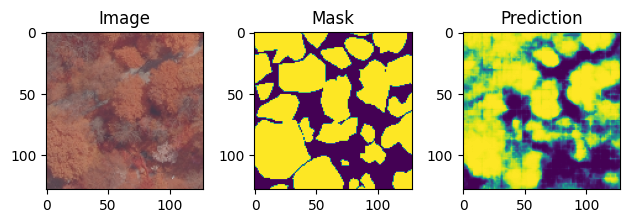

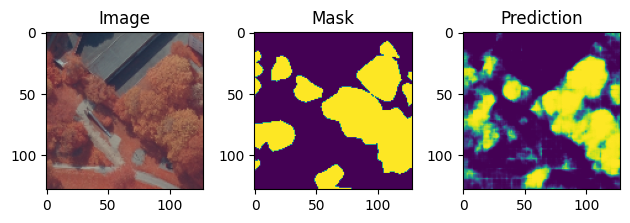

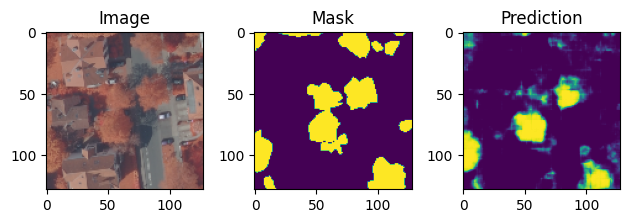

100/100 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.9508 - loss: 0.1115 - mean_iou: 0.8252 - val_accuracy: 0.8927 - val_loss: 0.2575 - val_mean_iou: 0.6569
Epoch 36/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9510 - loss: 0.1109 - mean_iou: 0.8269
Sample Prediction after epoch 36



2024-04-30 16:18:08.035124: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


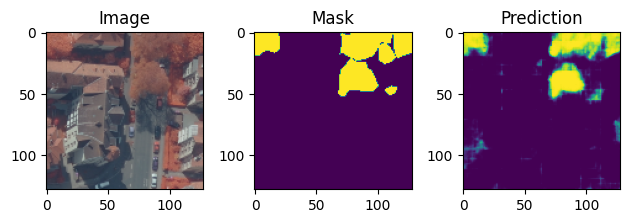

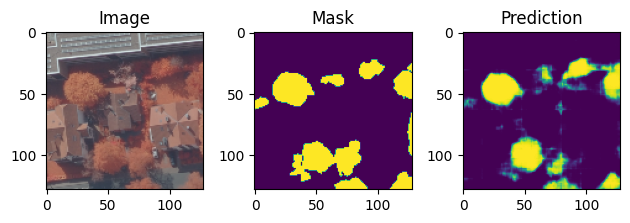

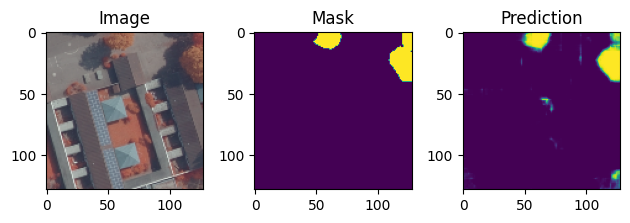

100/100 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step - accuracy: 0.9510 - loss: 0.1109 - mean_iou: 0.8270 - val_accuracy: 0.8946 - val_loss: 0.2607 - val_mean_iou: 0.6628
Epoch 37/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9513 - loss: 0.1102 - mean_iou: 0.8273
Sample Prediction after epoch 37



2024-04-30 16:22:11.582695: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


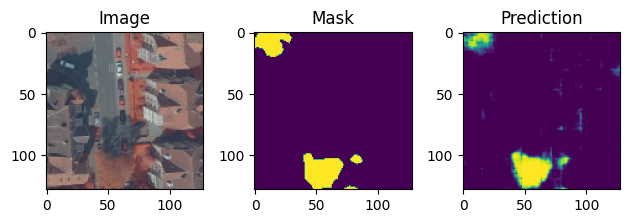

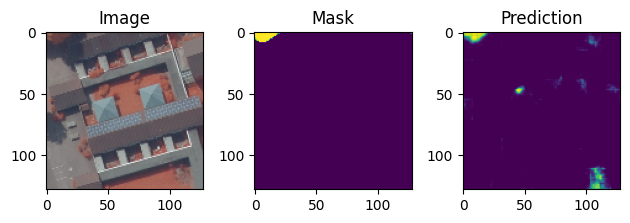

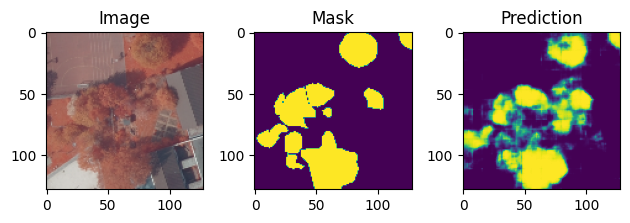

100/100 ━━━━━━━━━━━━━━━━━━━━ 244s 2s/step - accuracy: 0.9513 - loss: 0.1102 - mean_iou: 0.8273 - val_accuracy: 0.8949 - val_loss: 0.2585 - val_mean_iou: 0.6664
Epoch 38/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9523 - loss: 0.1080 - mean_iou: 0.8272
Sample Prediction after epoch 38



2024-04-30 16:28:07.865672: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


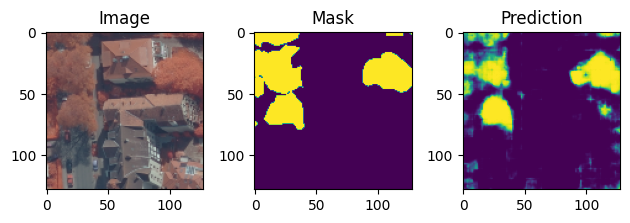

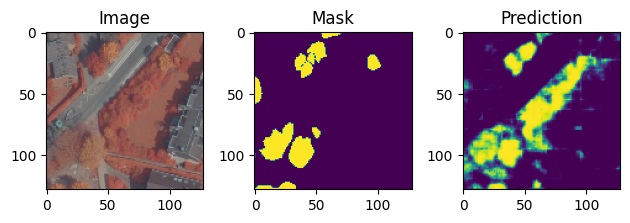

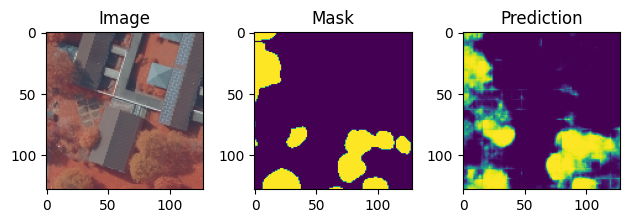

100/100 ━━━━━━━━━━━━━━━━━━━━ 359s 4s/step - accuracy: 0.9523 - loss: 0.1080 - mean_iou: 0.8272 - val_accuracy: 0.8964 - val_loss: 0.2649 - val_mean_iou: 0.6741
Epoch 39/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9527 - loss: 0.1070 - mean_iou: 0.8340
Sample Prediction after epoch 39



2024-04-30 16:33:11.149937: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


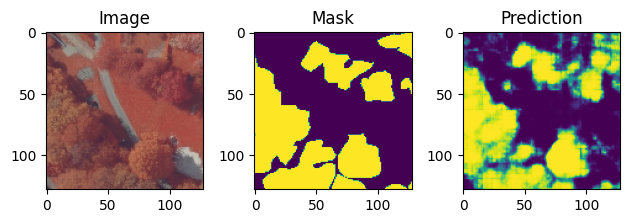

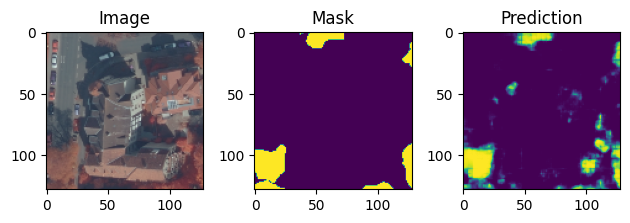

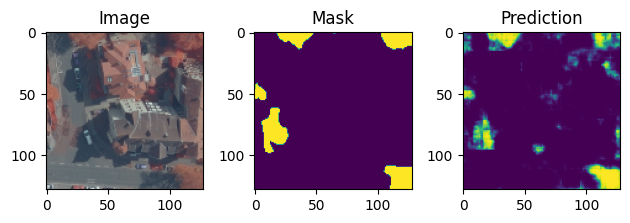

100/100 ━━━━━━━━━━━━━━━━━━━━ 307s 3s/step - accuracy: 0.9527 - loss: 0.1070 - mean_iou: 0.8340 - val_accuracy: 0.8955 - val_loss: 0.2663 - val_mean_iou: 0.6730
Epoch 40/40
 87/100 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9524 - loss: 0.1074 - mean_iou: 0.8296

In [10]:
train_steps = 100
valid_steps = 100

model_history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    validation_data=valid_dataset,
    callbacks=[DisplayCallback()]
)

In [ ]:
# save a copy of model_history object
import pickle
import os

if not os.path.exists('models'):
    os.makedirs('models')

with open('models/model_history.pkl', 'wb') as f:
    pickle.dump(model_history, f)

model.save('models/u_net.keras')

In [ ]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure()
plt.plot(model_history.epoch, loss, 'r', label='Training loss')
plt.plot(model_history.epoch, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0.005, 0.015])
plt.legend()
plt.show()

In [ ]:
show_predictions(n=20, dataset=test_dataset)

In [ ]:
for image, mask in list(test_dataset.take(1)):
    pred_mask_logits = model.predict(image, verbose=0)

    mean_iou_score = mean_iou(mask, pred_mask_logits)

    print(mean_iou_score)

threshold = tf.reduce_mean(pred_mask_logits)
thresholded_mask = tf.cast(pred_mask_logits >= threshold, tf.float32)



plt.imshow(pred_mask_logits[0, :, :, 0])
plt.colorbar()
plt.show()
plt.imshow(mask[0])
plt.show()
# difference between the two masks
plt.imshow(mask[0] - thresholded_mask[0, :, :, 0])

In [ ]:
tf.reduce_max(mask[0]), tf.reduce_min(mask[0])